<a href="https://colab.research.google.com/github/elder-rjvp/python/blob/main/yolov9_dataset_personalizado.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# YOLOv9 - Treinamento em *Dataset* Personalizado

Este notebook aborda o processo de treinamento do modelo YOLOv9 em um dataset customizado, o Rocket Detect, focado na detecção de componentes de lançamentos espaciais.

O dataset inclui imagens categorizadas em três classes: Engine Flames, Rocket Body e Space. Através deste notebook, exploraremos a preparação do dataset, visualização de dados, configuração e treinamento do modelo, além de avaliar o desempenho do modelo treinado.

<center>
<img src="https://sigmoidal.ai/wp-content/uploads/2024/02/2024-02-23-YOLOv9.png" width=600>
</center>

## Configuração do Ambiente

Primeiro, configuramos o ambiente no Google Colab e instalamos as dependências necessárias.

In [ ]:
!nvidia-smi

Tue Feb 27 12:55:45 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   38C    P8               9W /  70W |      0MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [ ]:
# Clona o repositório do YOLOv9
!git clone https://github.com/carlosfab/yolov9.git

# Muda o diretório de trabalho atual para o repositório YOLOv9 clonado
%cd yolov9

# Instala as dependências necessárias do YOLOv9 a partir do arquivo requirements.txt
!pip install -r requirements.txt -q

Cloning into 'yolov9'...
remote: Enumerating objects: 168, done.
remote: Counting objects: 100% (60/60), done.
remote: Compressing objects: 100% (29/29), done.
remote: Total 168 (delta 42), reused 31 (delta 31), pack-reused 108
Receiving objects: 100% (168/168), 618.92 KiB | 10.49 MiB/s, done.
Resolving deltas: 100% (68/68), done.
/content/yolov9
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 195.4/195.4 kB 4.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 4.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 11.0 MB/s eta 0:00:00


In [ ]:
# Importa bibliotecas necessárias
import sys
import os
import requests
from tqdm.notebook import tqdm
from pathlib import Path
from PIL import Image
from io import BytesIO
import matplotlib.pyplot as plt
from matplotlib.pylab import rcParams
from IPython.display import display, Image
from PIL import Image as PILImage


# Configuração de diretórios para código e dados
CODE_FOLDER = Path(".").resolve()  # Diretório do código
WEIGHTS_FOLDER = CODE_FOLDER / "weights"  # Diretório para pesos do modelo
DATA_FOLDER = CODE_FOLDER / "data"  # Diretório para dados

# Cria os diretórios para pesos e dados, se não existirem
WEIGHTS_FOLDER.mkdir(exist_ok=True, parents=True)
DATA_FOLDER.mkdir(exist_ok=True, parents=True)

# Adiciona o diretório do código ao path do Python para importação de módulos
sys.path.append(str(CODE_FOLDER))

rcParams['figure.figsize'] = 15, 15
%matplotlib inline

In [ ]:
# URLs dos arquivos de pesos
weight_files = [
    "https://github.com/WongKinYiu/yolov9/releases/download/v0.1/yolov9-c.pt",
    "https://github.com/WongKinYiu/yolov9/releases/download/v0.1/yolov9-e.pt",
    "https://github.com/WongKinYiu/yolov9/releases/download/v0.1/gelan-c.pt",
    "https://github.com/WongKinYiu/yolov9/releases/download/v0.1/gelan-e.pt"
]

# Itera sobre a lista de URLs para baixar os arquivos de pesos
for i, url in enumerate(weight_files, start=1):
    filename = url.split('/')[-1]
    response = requests.get(url, stream=True)
    total_size_in_bytes = int(response.headers.get('content-length', 0))
    block_size = 1024  # 1 Kilobyte
    progress_bar = tqdm(total=total_size_in_bytes, unit='iB', unit_scale=True, desc=f"Baixando arquivo {i}/{len(weight_files)}: {filename}")
    with open(WEIGHTS_FOLDER / filename, 'wb') as file:
        for data in response.iter_content(block_size):
            progress_bar.update(len(data))
            file.write(data)
    progress_bar.close()

Baixando arquivo 1/4: yolov9-c.pt:   0%|          | 0.00/103M [00:00<?, ?iB/s]

Baixando arquivo 2/4: yolov9-e.pt:   0%|          | 0.00/140M [00:00<?, ?iB/s]

Baixando arquivo 3/4: gelan-c.pt:   0%|          | 0.00/51.5M [00:00<?, ?iB/s]

Baixando arquivo 4/4: gelan-e.pt:   0%|          | 0.00/117M [00:00<?, ?iB/s]

## Visão Geral do Dataset *"Rocket Detect"*

O *dataset* "Rocket Detect" é empregado no treinamento da rede neural do sistema Autotrack, uma solução automatizada de rastreamento de foguetes desenvolvida pela NASASpaceflight.

Este dataset é dividido em três classes principais, facilitando a identificação e o rastreamento dos elementos associados ao lançamento de foguetes. As classes são definidas como segue:

- **`Engine Flames`**: Representa as chamas geradas pelo motor do foguete durante o lançamento. Essencial para identificar a ativação e operação do motor.
- **`Rocket Body`**: Indica o corpo principal do veículo de lançamento, incluindo todas as seções estruturais do foguete.
- **`Space`**: Denota o foguete após sua ascensão ao espaço, geralmente capturado como um ponto distante na imagem.

Utilizando as tecnologias YoloV5 e Strongsort, o dataset "Rocket Detect" demonstrou eficácia na tarefa de rastreamento contínuo do primeiro estágio do Falcon 9, desde o lançamento até o pouso. A aplicabilidade do dataset se estende a uma ampla variedade de veículos de lançamento, com planos de expansão contínua para aumentar a precisão e a confiabilidade do rastreamento.

Agora, iremos testar também a eficácia de rastreamento usando o YOLOv9.

> A versão 37 do *dataset* é composta de 28.149 imagens. No entanto, para evitar longas horas de treinamento nesta aula, usarei a versão 36, que contém  por 12.041 imagens.



In [ ]:
# Instalação da biblioteca Roboflow sem mostrar logs desnecessários
!pip install -q roboflow

# Importação da biblioteca Roboflow
import roboflow

# Autenticação no Roboflow
roboflow.login()  # Nota: Certifique-se de configurar sua chave de API do Roboflow antes de chamar login()

# Inicialização do cliente Roboflow
rf = roboflow.Roboflow()

# Acessando o projeto específico e baixando a versão desejada do dataset para YOLOv9
project = rf.workspace("nasaspaceflight").project("rocket-detect")
dataset = project.version(36).download("yolov9")

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 70.2/70.2 kB 2.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 158.3/158.3 kB 6.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 178.7/178.7 kB 20.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 8.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.1/49.1 MB 33.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 86.7/86.7 kB 12.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.5/54.5 kB 6.6 MB/s eta 0:00:00
visit https://app.roboflow.com/auth-cli to get your authentication token.
Paste the authentication token here: ··········
loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to Rocket-Detect-36 in yolov9:: 100%|██████████| 24094/24094 [00:02<00:00, 10434.28it/s]


## Treinamento do Modelo

In [ ]:
!python train.py \
--batch 16 --epochs 20 --img 640 --device 0 --min-items 0 \
--data {dataset.location}/data.yaml \
--weights {WEIGHTS_FOLDER}/gelan-c.pt \
--cfg models/detect/gelan-c.yaml \
--hyp hyp.scratch-high.yaml

2024-02-26 17:11:34.910304: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-02-26 17:11:34.910351: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-02-26 17:11:34.911677: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-02-26 17:11:35.931134: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
train: weights=/content/weights/gelan-c.pt, cfg=models/detect/gelan-c.yaml, data=/content/yolov9/Rocket-Detect-37/data.yaml, hyp=hyp.scratch-high.yaml, epochs=20, batch_size=16, imgsz=640, rect=False, resume=False, nosave=False, noval=False,

## Salvar e Carregar os Pesos do Treinamento (Opcional)

Durante ou após o treinamento no Google Colab, é comum enfrentar o desafio de desconexões após um período de inatividade ou após atingir o limite máximo de uso contínuo.

Isso pode resultar na perda de progresso do treinamento e, consequentemente, na necessidade de reiniciar o treinamento do zero.

Para mitigar esse problema e garantir a continuidade do trabalho, é recomendável salvar os pesos do modelo treinado no Google Drive.

### Salvar os Pesos no Google Drive

Para salvar os pesos no Google Drive, primeiro é necessário montar o Google Drive no ambiente do Colab. Isso pode ser feito utilizando a biblioteca `google.colab` e o método `drive.mount('/content/drive')`, o qual solicitará autenticação e permitirá acessar os arquivos do seu Google Drive como se fossem locais.

Após montar o drive, você pode especificar o caminho no Google Drive onde deseja salvar os pesos. Ao configurar o treinamento do seu modelo, certifique-se de que os checkpoints sejam salvos nesse diretório. Muitos frameworks de aprendizado profundo, como TensorFlow e PyTorch, oferecem callbacks ou configurações para salvar automaticamente os pesos durante o treinamento.

In [ ]:
# from google.colab import drive
# import shutil

# # Montar Google Drive
# drive.mount('/content/drive')

# # Definir os caminhos de origem e destino
# source_path = f'{CODE_FOLDER}/runs'
# destination_path = '/content/drive/MyDrive/yolov9-rocket-detect'

# # Verificar se o diretório de destino existe; se sim, removê-lo
# if os.path.exists(destination_path):
#     shutil.rmtree(destination_path)

# # Copiar o conteúdo do Google Drive para o ambiente Colab
# shutil.copytree(source_path, destination_path)
# print("Pesos do treinamento copiados para o Google Drive com sucesso.")


### Carregar os Pesos para Continuar o Treinamento

Quando precisar retomar o treinamento, você pode facilmente carregar os pesos salvos no Google Drive para o seu modelo. Isso é feito especificando o caminho dos pesos salvos ao configurar o modelo para treinamento. Ao iniciar o treinamento, o modelo continuará a partir dos pesos carregados, permitindo uma transição suave e a continuação do progresso sem interrupções.

Essa prática não apenas economiza tempo e recursos computacionais, mas também facilita a experimentação com diferentes configurações de hiperparâmetros, arquiteturas de modelo e conjuntos de dados, tornando o processo de desenvolvimento de modelos de aprendizado de máquina mais eficiente e menos suscetível a interrupções indesejadas.


In [ ]:
from google.colab import drive
import shutil

# Montar Google Drive
drive.mount('/content/drive')

# Definir os caminhos de origem e destino
# Substitua 'destination_path' pelo caminho no Google Drive onde os pesos foram salvos
source_path = '/content/drive/MyDrive/yolov9-rocket-detect'
destination_path = f'{CODE_FOLDER}/runs'

# Verificar se a origem contém os arquivos necessários, se sim, copiá-los de volta para o Colab
if os.path.exists(source_path):
    shutil.copytree(source_path, destination_path, dirs_exist_ok=True)
    print("Pesos do treinamento carregados do Google Drive com sucesso.")
else:
    print("Diretório de pesos não encontrado no Google Drive.")


Mounted at /content/drive
Pesos do treinamento carregados do Google Drive com sucesso.


In [ ]:
!ls {CODE_FOLDER}/runs

train


# Análise dos Resultados do Treino

Os resultados de cada sessão de treinamento são armazenados automaticamente em `{CODE_FOLDER}/runs/train/`, dentro de pastas sequenciais `exp`, `exp2`, ...

In [ ]:
from prettytable import PrettyTable
import time

# Caminho do diretório que você deseja listar
directory_path = f'{CODE_FOLDER}/runs/train/exp'

# Criar uma tabela bonita
table = PrettyTable()
table.field_names = ["Filename", "Size (KB)", "Modification Date"]

# Listar arquivos no diretório
for filename in os.listdir(directory_path):
    filepath = os.path.join(directory_path, filename)
    if os.path.isfile(filepath):
        # Obter o tamanho do arquivo
        size = os.path.getsize(filepath) / 1024  # Tamanho em KB
        # Obter a data de modificação
        mod_time = os.path.getmtime(filepath)
        mod_time = time.strftime('%Y-%m-%d %H:%M:%S', time.localtime(mod_time))
        # Adicionar linha à tabela
        table.add_row([filename, f"{size:.2f}", mod_time])

# Ordenar a tabela pelo nome do arquivo (opcional)
table.sortby = "Filename"

# Exibir a tabela
print(table)


+----------------------------------------------------+-----------+---------------------+
|                      Filename                      | Size (KB) |  Modification Date  |
+----------------------------------------------------+-----------+---------------------+
|                    F1_curve.png                    |   190.77  | 2024-02-26 19:42:56 |
|                    PR_curve.png                    |   161.62  | 2024-02-26 19:42:56 |
|                    P_curve.png                     |   167.63  | 2024-02-26 19:42:56 |
|                    R_curve.png                     |   182.13  | 2024-02-26 19:42:56 |
|                confusion_matrix.png                |   128.51  | 2024-02-26 19:42:57 |
| events.out.tfevents.1708968103.05083ebd1865.1478.0 |  1944.41  | 2024-02-26 19:43:03 |
|                      hyp.yaml                      |    0.36   | 2024-02-26 17:21:43 |
|                     labels.jpg                     |   148.67  | 2024-02-26 17:21:53 |
|               label

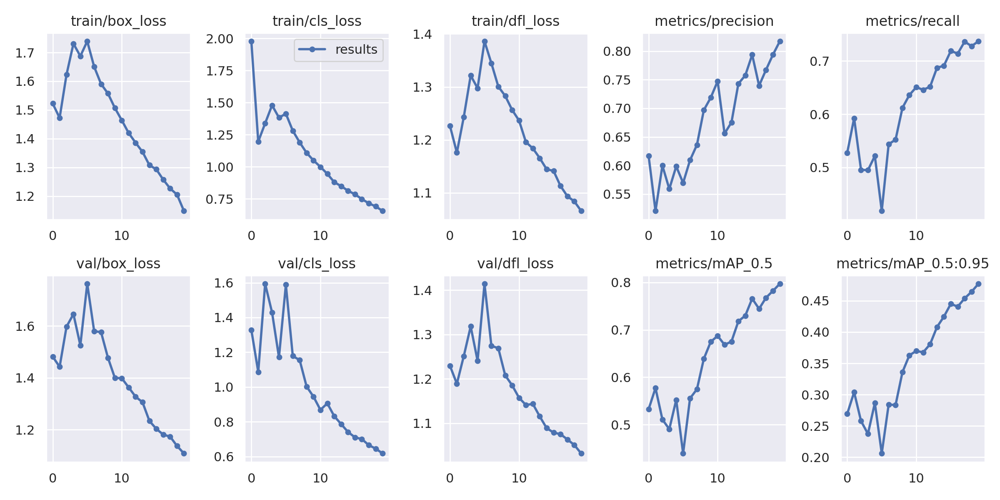

In [ ]:
# Caminho para a imagem 'results.png'
results_image_path = f'{CODE_FOLDER}/runs/train/exp/results.png'

# Exibe a imagem com um tamanho específico
Image(filename=results_image_path, width=800)

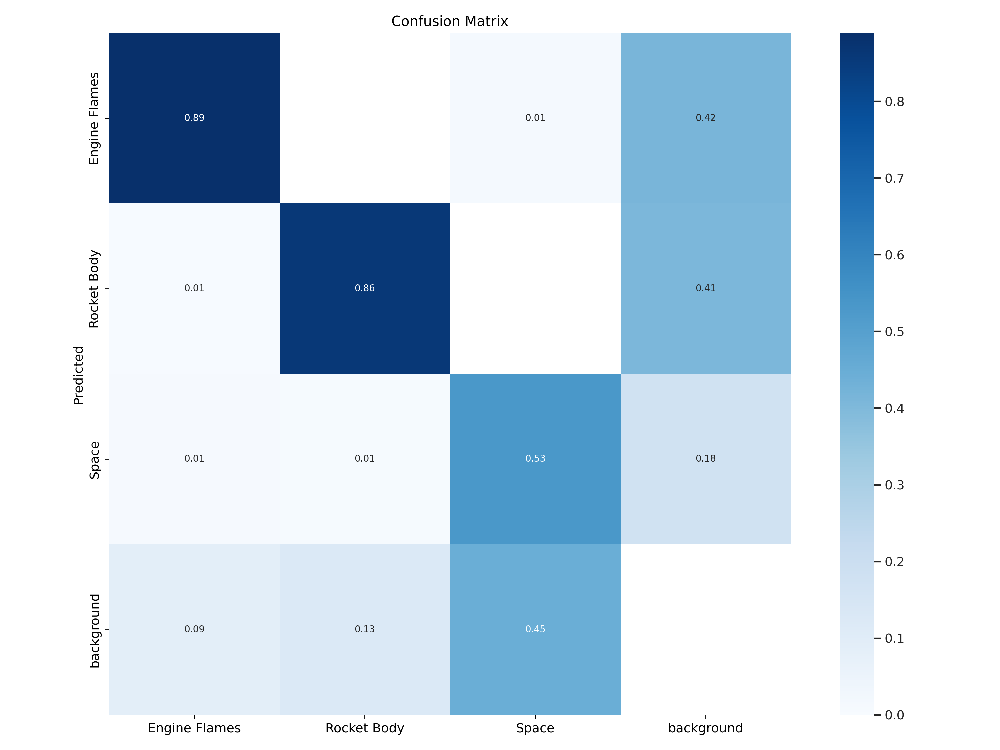

In [ ]:
# Caminho para a imagem 'confusion_matrix.png'
results_image_path = f'{CODE_FOLDER}/runs/train/exp/confusion_matrix.png'

# Exibe a imagem com um tamanho específico
Image(filename=results_image_path, width=800)

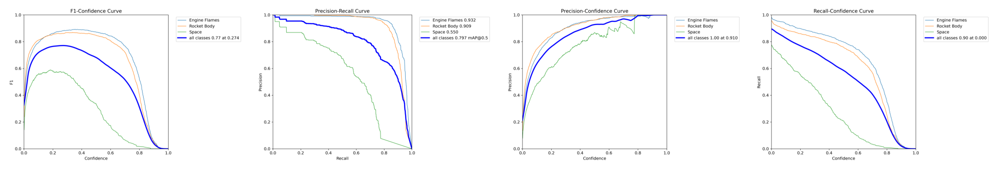

In [ ]:
# Caminho para o diretório com as imagens das métricas
metrics_folder = os.path.join(CODE_FOLDER, 'runs/train/exp')

# Lista de nomes de arquivos das principais métricas a serem exibidas
metrics_files = ['F1_curve.png', 'PR_curve.png', 'P_curve.png', 'R_curve.png']

# Cria uma figura e um conjunto de subplots
fig, axs = plt.subplots(1, len(metrics_files), figsize=(20, 4))

# Loop para exibir cada imagem no subplot correspondente
for ax, metric_file in zip(axs, metrics_files):
    img_path = os.path.join(metrics_folder, metric_file)
    img = PILImage.open(img_path)
    ax.imshow(img)
    ax.axis('off')

plt.tight_layout()
plt.show()


## Validar Modelo Personalizado

In [ ]:
!python val.py \
--img 640 --batch 32 --conf 0.001 --iou 0.7 --device 0 \
--data {dataset.location}/data.yaml \
--weights {CODE_FOLDER}/runs/train/exp/weights/best.pt

val: data=/content/yolov9/yolov9/yolov9/Rocket-Detect-36/data.yaml, weights=['/content/yolov9/yolov9/yolov9/runs/train/exp/weights/best.pt'], batch_size=32, imgsz=640, conf_thres=0.001, iou_thres=0.7, max_det=300, task=val, device=0, workers=8, single_cls=False, augment=False, verbose=False, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=runs/val, name=exp, exist_ok=False, half=False, dnn=False, min_items=0
YOLOv5 🚀 26e3791 Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
gelan-c summary: 467 layers, 25413273 parameters, 0 gradients, 102.5 GFLOPs
100% 755k/755k [00:00<00:00, 5.49MB/s]
val: Scanning /content/yolov9/yolov9/yolov9/Rocket-Detect-36/valid/labels... 2376 images, 472 backgrounds, 0 corrupt: 100% 2376/2376 [00:00<00:00, 6725.87it/s]
val: New cache created: /content/yolov9/yolov9/yolov9/Rocket-Detect-36/valid/labels.cache
                 Class     Images  Instances          P          R      mAP50   mAP50-95: 100% 75

## Inferência com Modelo Personalizado

In [ ]:
DATA_FOLDER

PosixPath('/content/yolov9/data')

In [ ]:
!wget -P {DATA_FOLDER} https://github.com/carlosfab/visao-computacional/raw/main/data/Falcon_9_USSF_124.mp4

--2024-02-27 13:00:46--  https://github.com/carlosfab/visao-computacional/raw/main/data/Falcon_9_USSF_124.mp4
Resolving github.com (github.com)... 140.82.112.3
Connecting to github.com (github.com)|140.82.112.3|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/carlosfab/visao-computacional/main/data/Falcon_9_USSF_124.mp4 [following]
--2024-02-27 13:00:46--  https://raw.githubusercontent.com/carlosfab/visao-computacional/main/data/Falcon_9_USSF_124.mp4
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.110.133, 185.199.109.133, 185.199.108.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.110.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 6037715 (5.8M) [application/octet-stream]
Saving to: ‘/content/yolov9/data/Falcon_9_USSF_124.mp4’

Falcon_9_USSF_124.m 100%[===================>]   5.76M  --.-KB/s    in 0.09s   

2024-02-27 13:00:47 (

In [ ]:
!python detect.py \
  --img 1280 --conf 0.1 --device 0 \
  --weights {CODE_FOLDER}/runs/train/exp/weights/best.pt \
  --source {DATA_FOLDER}/Falcon_9_USSF_124.mp4

detect: weights=['/content/yolov9/runs/train/exp/weights/best.pt'], source=/content/yolov9/data/Falcon_9_USSF_124.mp4, data=data/coco128.yaml, imgsz=[1280, 1280], conf_thres=0.1, iou_thres=0.45, max_det=1000, device=0, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 26e3791 Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
gelan-c summary: 467 layers, 25413273 parameters, 0 gradients, 102.5 GFLOPs
video 1/1 (1/767) /content/yolov9/data/Falcon_9_USSF_124.mp4: 736x1280 1 Engine Flames, 1 Rocket Body, 94.9ms
video 1/1 (2/767) /content/yolov9/data/Falcon_9_USSF_124.mp4: 736x1280 1 Engine Flames, 1 Rocket Body, 60.8ms
video 1/1 (3/767) /content/yolov9/data/Falcon_9_USSF_124.mp4: 736x1280 1 Engine Flames, 1 R

In [ ]:
from moviepy.editor import VideoFileClip

# Caminho para o vídeo processado
processed_video_path = f"{CODE_FOLDER}/runs/detect/exp/Falcon_9_USSF_124.mp4"

# Carregar o vídeo com MoviePy
clip = VideoFileClip(processed_video_path)

# Exibir o vídeo no notebook com largura ajustada
clip.ipython_display(width=600)

Moviepy - Building video __temp__.mp4.
Moviepy - Writing video __temp__.mp4



t:  99%|█████████▉| 764/768 [00:10<00:00, 69.69it/s, now=None]WARNING:py.warnings:Warning: in file /content/yolov9/runs/detect/exp/Falcon_9_USSF_124.mp4, 6220800 bytes wanted but 0 bytes read,at frame 767/768, at time 25.57/25.57 sec. Using the last valid frame instead.



Moviepy - Done !
Moviepy - video ready __temp__.mp4


In [ ]:
!wget -P {DATA_FOLDER} https://github.com/carlosfab/visao-computacional/raw/main/data/Starship_IFT_2_1.mp4

--2024-02-27 13:05:05--  https://github.com/carlosfab/visao-computacional/raw/main/data/Starship_IFT_2_1.mp4
Resolving github.com (github.com)... 140.82.112.3
Connecting to github.com (github.com)|140.82.112.3|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/carlosfab/visao-computacional/main/data/Starship_IFT_2_1.mp4 [following]
--2024-02-27 13:05:05--  https://raw.githubusercontent.com/carlosfab/visao-computacional/main/data/Starship_IFT_2_1.mp4
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.111.133, 185.199.109.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1855610 (1.8M) [application/octet-stream]
Saving to: ‘/content/yolov9/data/Starship_IFT_2_1.mp4’

Starship_IFT_2_1.mp 100%[===================>]   1.77M  --.-KB/s    in 0.07s   

2024-02-27 13:05:05 (24.8

In [ ]:
!python detect.py \
  --img 1280 --conf 0.3 --device 0 \
  --weights {CODE_FOLDER}/runs/train/exp/weights/best.pt \
  --source {DATA_FOLDER}/Starship_IFT_2_1.mp4

detect: weights=['/content/yolov9/runs/train/exp/weights/best.pt'], source=/content/yolov9/data/Starship_IFT_2_1.mp4, data=data/coco128.yaml, imgsz=[1280, 1280], conf_thres=0.3, iou_thres=0.45, max_det=1000, device=0, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 26e3791 Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
gelan-c summary: 467 layers, 25413273 parameters, 0 gradients, 102.5 GFLOPs
video 1/1 (1/397) /content/yolov9/data/Starship_IFT_2_1.mp4: 736x1280 1 Engine Flames, 96.0ms
video 1/1 (2/397) /content/yolov9/data/Starship_IFT_2_1.mp4: 736x1280 1 Engine Flames, 60.5ms
video 1/1 (3/397) /content/yolov9/data/Starship_IFT_2_1.mp4: 736x1280 1 Engine Flames, 61.1ms
video 1/1 (4/397) /content/yol

In [ ]:
# Caminho para o vídeo processado
processed_video_path = f"{CODE_FOLDER}/runs/detect/exp3/Starship_IFT_2_1.mp4"

# Carregar o vídeo com MoviePy
clip = VideoFileClip(processed_video_path)

# Exibir o vídeo no notebook com largura ajustada
clip.ipython_display(width=600)

Moviepy - Building video __temp__.mp4.
Moviepy - Writing video __temp__.mp4



Moviepy - Done !
Moviepy - video ready __temp__.mp4
